In [7]:
# !pip install matplotlib
# !pip install chart-studio
# !pip install --upgrade xlrd==1.2.0
# !pip install pandas==1.2.0
# !pip install scikit-learn
# import os
# os.kill(os.getpid(), 9)
# !sudo apt-get install build-essential swig
# !curl https://raw.githubusercontent.com/automl/auto-sklearn/master/requirements.txt | xargs -n 1 -L 1 pip install
# !pip install auto-sklearn

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import chart_studio.plotly as py
import scipy.cluster.hierarchy as shc
from sklearn.decomposition import TruncatedSVD 
import statistics
from scipy.stats import stats
from sklearn.metrics import silhouette_score, silhouette_samples
from matplotlib import cm
from math import lgamma
# from numba import jit
from scipy.stats import beta
from statsmodels.stats.multicomp import pairwise_tukeyhsd

**Подоготовка датасетов**

In [10]:
# Загружаем данные о транзакциях
full_ds = pd.read_excel("electronika_full.xlsx")
full_ds['Actions'] = full_ds['Actions'].fillna('БезАкций')
full_ds = full_ds.dropna(subset=['TN'])

full_ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 286554 entries, 2 to 536383
Data columns (total 38 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Order_ID      286554 non-null  object        
 1   Email_new     286554 non-null  object        
 2   Phone_new     286554 non-null  object        
 3   Area2         286552 non-null  object        
 4   Source        286554 non-null  object        
 5   OrderDate     286554 non-null  datetime64[ns]
 6   время         286554 non-null  object        
 7   месяц         286554 non-null  int64         
 8   ChangeDate    286554 non-null  object        
 9   DeliveryDate  286554 non-null  object        
 10  PaymentDate   286554 non-null  object        
 11  Status        286554 non-null  object        
 12  Status_ID     286554 non-null  int64         
 13  OneClick      286554 non-null  int64         
 14  CancelReason  99241 non-null   object        
 15  Actions       286

In [14]:
len(full_ds)

286554

In [11]:
# Загружаем датасет (витрина клиентов)
base_ds = pd.read_excel("electronika_ds.xlsx")

base_ds = base_ds.loc[base_ds['Кол-во чеков'] < 20]
base_ds = base_ds.set_index('Клиент')

base_ds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 131981 entries, 32565748-000000000 to 57565355-57554952485597
Data columns (total 37 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   Кол-во чеков                               131981 non-null  int64  
 1   Средний чек                                131981 non-null  float64
 2   Среднее кол-во товаров в чеке              131981 non-null  float64
 3   Выручка                                    131981 non-null  int64  
 4   Кол-во товаров                             131981 non-null  int64  
 5   Кол-во выкупленных чеков                   131981 non-null  int64  
 6   Средний выкупленный чек                    131981 non-null  float64
 7   Среднее кол-во товаров в выкупленном чеке  131981 non-null  float64
 8   Выручка по выкупленным                     131981 non-null  int64  
 9   Кол-во выкупленных товаров                 131981 no

In [13]:
len(base_ds)

131981

**Построение корреляционной матрицы и выбор факторов**

<AxesSubplot:>

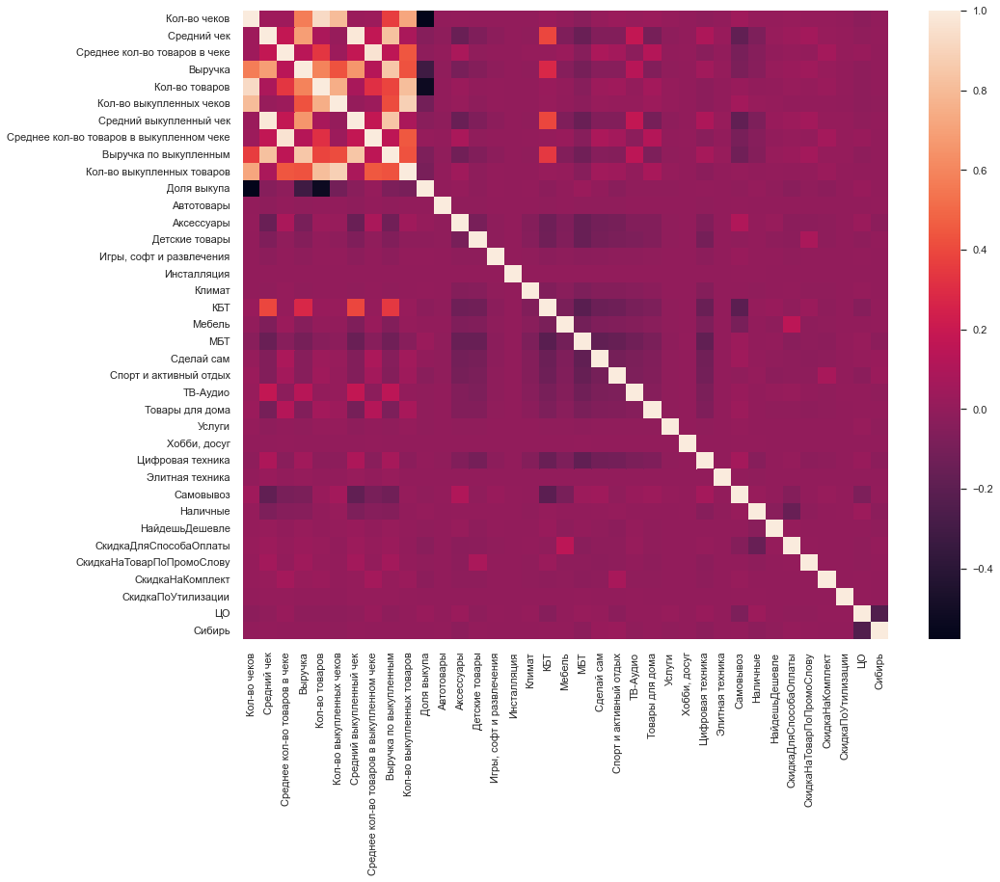

In [12]:
corr_matrix = base_ds.iloc[:,:].corr()
plt.figure(figsize=(15, 12))
sns.heatmap(corr_matrix)

In [6]:
# model = TSNE(learning_rate=100)

# X = ds.values[:,:]
# transformed = model.fit_transform(X)

# x_axis = transformed[:, 0]
# y_axis = transformed[:, 1]

# plt.scatter(x_axis, y_axis, c=iris_df.target)
# plt.show()

**K-means кластеризация**

<class 'pandas.core.frame.DataFrame'>
Index: 131981 entries, 32565748-000000000 to 57565355-57554952485597
Data columns (total 11 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Средний чек                    131981 non-null  float64
 1   Среднее кол-во товаров в чеке  131981 non-null  float64
 2   Доля выкупа                    131981 non-null  float64
 3   Детские товары                 131981 non-null  float64
 4   КБТ                            131981 non-null  float64
 5   МБТ                            131981 non-null  float64
 6   Сделай сам                     131981 non-null  float64
 7   Спорт и активный отдых         131981 non-null  float64
 8   ЦО                             131981 non-null  int64  
 9   Самовывоз                      131981 non-null  float64
 10  Наличные                       131981 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 16.1+ MB


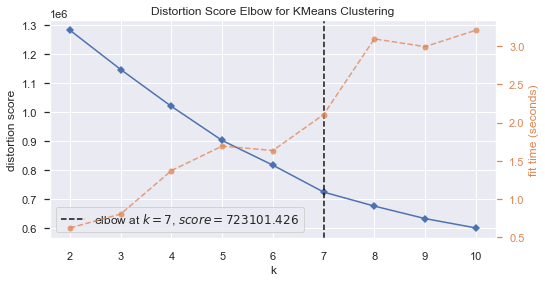

c:\users\alexander\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


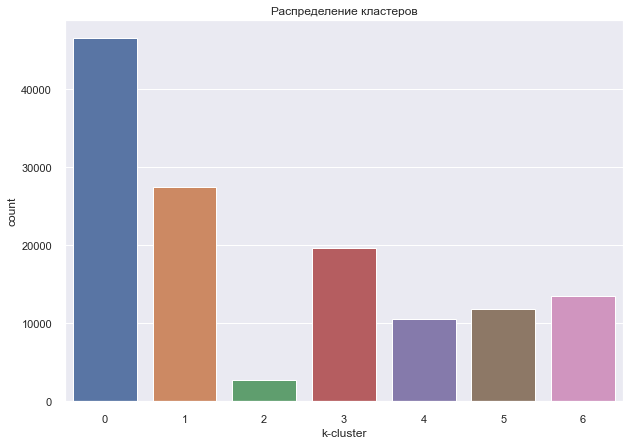


Доли по кластерам
0: 35.246740061069396
1: 20.801479000765262
2: 1.9881649631386338
3: 14.845318644350321
4: 7.9602367007372274
5: 8.922496419939234
6: 10.235564209999923

Свод по кластерам


,Средний чек,Среднее кол-во товаров в чеке,Доля выкупа,Детские товары,КБТ,МБТ,Сделай сам,Спорт и активный отдых,ЦО,Самовывоз,Наличные
k-cluster,,,,,,,,,,,
0,7498.145692,2.071205,0.930420,0.003091,0.005801,0.009192,0.005734,0.003487,0.560653,0.816646,0.740212
1,5198.156933,2.052942,0.954640,0.000500,0.001250,0.496877,0.000557,0.000503,0.553435,0.777775,0.746198
2,25706.149261,4.615919,0.928933,0.017905,0.108615,0.099685,0.080156,0.053313,0.611280,0.515098,0.628112
3,20289.594574,2.090012,0.929351,0.000595,0.482304,0.005793,0.001811,0.000792,0.485735,0.522416,0.758256
4,6180.664204,2.080166,0.931297,0.509383,0.000449,0.002579,0.000934,0.001223,0.515705,0.723389,0.755454
5,6856.213725,2.138281,0.918903,0.001584,0.000897,0.003590,0.002261,0.506932,0.493631,0.731430,0.765203
6,6881.392985,2.151080,0.943268,0.000469,0.001594,0.002734,0.516985,0.001027,0.556740,0.801827,0.760712


In [13]:
ds = base_ds[['Средний чек', 'Среднее кол-во товаров в чеке', 'Доля выкупа', 'Детские товары', 'КБТ', "МБТ", "Сделай сам", "Спорт и активный отдых", "ЦО", "Самовывоз", "Наличные"]]
# ds = ds.iloc[:10000,:]
X = ds.values[:,:]
X_n = StandardScaler().fit_transform(X)

ds.info()

Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(X_n)
sns.set(rc={'figure.figsize':(8,4)})
Elbow_M.show()

k_means = KMeans(init="k-means++", n_clusters=Elbow_M.elbow_value_, n_init=12)
k_means.fit(X_n)
labels = k_means.labels_

ds["k-cluster"] = labels

plt.figure(figsize=(10, 7))
pl = sns.countplot(x=ds["k-cluster"])
pl.set_title("Распределение кластеров")
plt.show()

print("\nДоли по кластерам")
for i in sorted(ds['k-cluster'].unique()):
  print(str(i) + ": " + str(ds['k-cluster'].value_counts().loc[i] / len(ds) * 100))

print("\nСвод по кластерам")
ds.groupby("k-cluster").mean()

In [8]:
def get_kruskal_results(ds, cl_type='k'):

    for column in ds:
        krus_arr = []
        for cluster in sorted(ds[cl_type+'-cluster'].unique()):
            krus_arr.append(ds.loc[ds[cl_type+'-cluster']==cluster][column])

        print(str(stats.kruskal(*krus_arr).pvalue < 0.05))

In [213]:
def get_silhouette(y, model):
    cluster_labels=np.unique(y)
    n_clusters=cluster_labels.shape[0]
    silhouette_score_cluster=silhouette_score(X_n,model.labels_)
    print("Silhouette Score: %.3f" % silhouette_score_cluster)
    silhouette_vals=silhouette_samples(X_n,y,metric='euclidean')
    y_ax_lower,y_ax_upper=0,0
    yticks=[]
    for i,c in enumerate(cluster_labels):
        c_silhouette_vals=silhouette_vals[y==c]
        c_silhouette_vals.sort()
        y_ax_upper+=len(c_silhouette_vals)
        color=cm.jet(float(i)/n_clusters)
        plt.barh(range(y_ax_lower,y_ax_upper),
                 c_silhouette_vals,
                 height=1.0,
                 edgecolor='none',
                 color=color)
        yticks.append((y_ax_lower+y_ax_upper)/2.0)
        y_ax_lower+=len(c_silhouette_vals)

    silhouette_avg=np.mean(silhouette_vals)
    plt.axvline(silhouette_avg,
                color='red',
                linestyle='--')
    plt.yticks(yticks,cluster_labels+1)
    plt.ylabel("Cluster")
    plt.xlabel("Silhouette Coefficients")
    plt.savefig('./fig4.png')
    plt.show()

In [218]:
get_kruskal_results(ds, 'k')

True
True
True
True
True
True
True
True
True
True
True
True


In [222]:
cluster_labels=np.unique(labels)
cluster_labels
len(X_n)

131981

Silhouette Score: 0.265


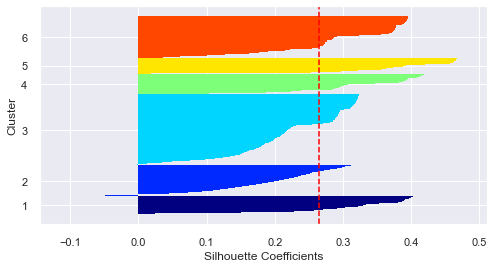

In [220]:
k_means = KMeans(init="k-means++", n_clusters=Elbow_M.elbow_value_, n_init=12)
y = k_means.fit_predict(X_n)

get_silhouette(y, k_means)

**Иерархическая кластеризация**

In [209]:
ds = base_ds[['Средний чек', 'Среднее кол-во товаров в чеке', 'Доля выкупа', 'Детские товары', 'КБТ', "МБТ", "Сделай сам", "Спорт и активный отдых", "ЦО", "Самовывоз", "Наличные"]]
ds = ds.iloc[:10000,:]
X = ds.values[:,:]
X_n = StandardScaler().fit_transform(X)

# truncatedSVD=TruncatedSVD(2)
# X_trn = truncatedSVD.fit_transform(X_n)
# X_trn[:10]

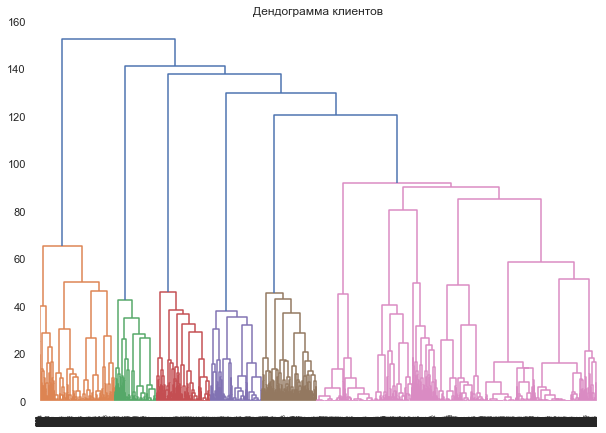

In [18]:
# plt.figure(figsize=(10, 7))
# plt.title("Дендограмма клиентов")
# dend = shc.dendrogram(shc.linkage(X_n, method='ward'))

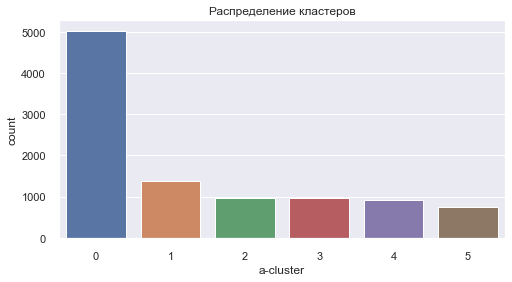


Доли по кластерам
0: 50.23
1: 13.700000000000001
2: 9.75
3: 9.76
4: 9.139999999999999
5: 7.42

Свод по кластерам


,Средний чек,Среднее кол-во товаров в чеке,Доля выкупа,Детские товары,КБТ,МБТ,Сделай сам,Спорт и активный отдых,ЦО,Самовывоз,Наличные
a-cluster,,,,,,,,,,,
0,6693.347388,2.130210,0.998134,0.002498,0.004574,0.185109,0.003721,0.002698,0.516424,0.827388,0.743930
1,20293.812815,2.165602,0.993407,0.000295,0.488181,0.007165,0.002387,0.000881,0.502920,0.554837,0.778304
2,9698.150135,2.103613,0.490321,0.002698,0.091574,0.120706,0.072979,0.011084,0.507692,0.790170,0.741825
3,6358.571942,2.167166,0.918000,0.000563,0.002012,0.002947,0.005415,0.507276,0.488730,0.800066,0.767408
4,6561.505121,2.138530,0.997730,0.000075,0.001770,0.003282,0.513279,0.000795,0.502188,0.849002,0.777792
5,5699.110020,2.080180,0.915340,0.500724,0.001011,0.004266,0.000571,0.002670,0.454178,0.777226,0.759051


In [210]:
cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
y = cluster.fit_predict(X_n[:10000])

# добавим кластеры к данным
ds["a-cluster"] = cluster.labels_

# clusterization_info('a')
# построим график подсчета кластеров
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=ds["a-cluster"])
pl.set_title("Распределение кластеров")
plt.show()

print("\nДоли по кластерам")
for i in sorted(ds['a-cluster'].unique()):
  print(str(i) + ": " + str(ds['a-cluster'].value_counts().loc[i] / len(ds) * 100))

print("\nСвод по кластерам")
ds.groupby("a-cluster").mean()

In [215]:
len(X_n)

10000

True
True
True
True
True
True
True
True
True
True
True
True
Silhouette Score: 0.284


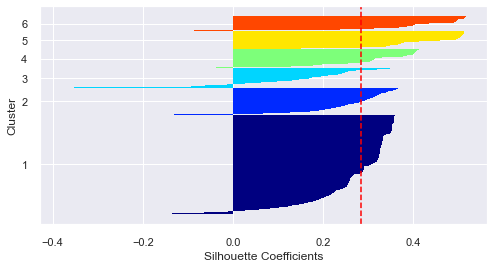

In [216]:
get_kruskal_results(ds, 'a')

get_silhouette(y, cluster)

In [38]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 131981 entries, 32565748-000000000 to 57565355-57554952485597
Data columns (total 12 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Средний чек                    131981 non-null  float64
 1   Среднее кол-во товаров в чеке  131981 non-null  float64
 2   Доля выкупа                    131981 non-null  float64
 3   Детские товары                 131981 non-null  float64
 4   КБТ                            131981 non-null  float64
 5   МБТ                            131981 non-null  float64
 6   Сделай сам                     131981 non-null  float64
 7   Спорт и активный отдых         131981 non-null  float64
 8   ЦО                             131981 non-null  int64  
 9   Самовывоз                      131981 non-null  float64
 10  Наличные                       131981 non-null  float64
 11  k-cluster                      131981 non-null  int32  
dtypes

**Исследование акций и категорий товаров**

Детские товары


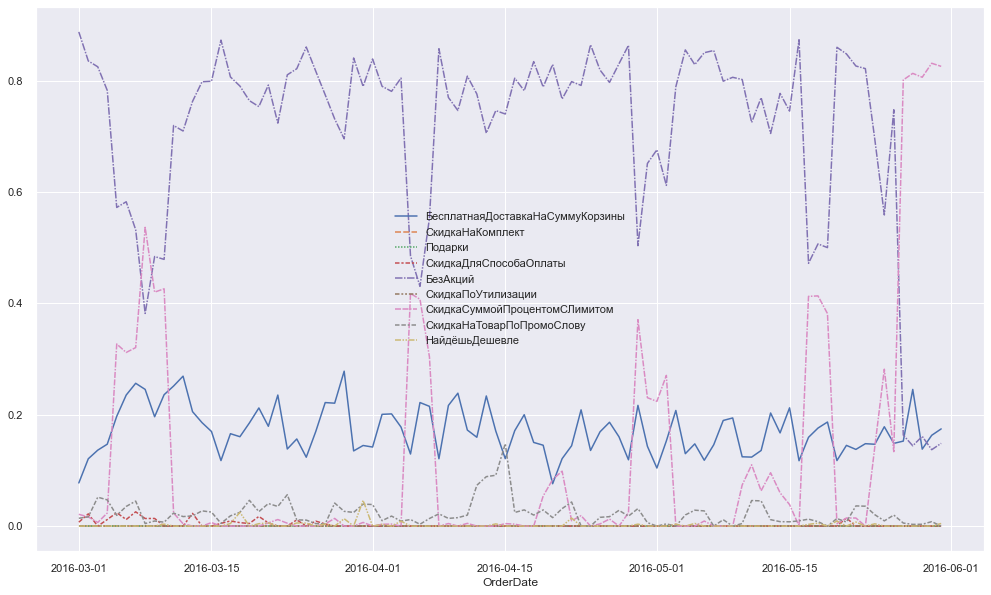

Крупная бытовая техника


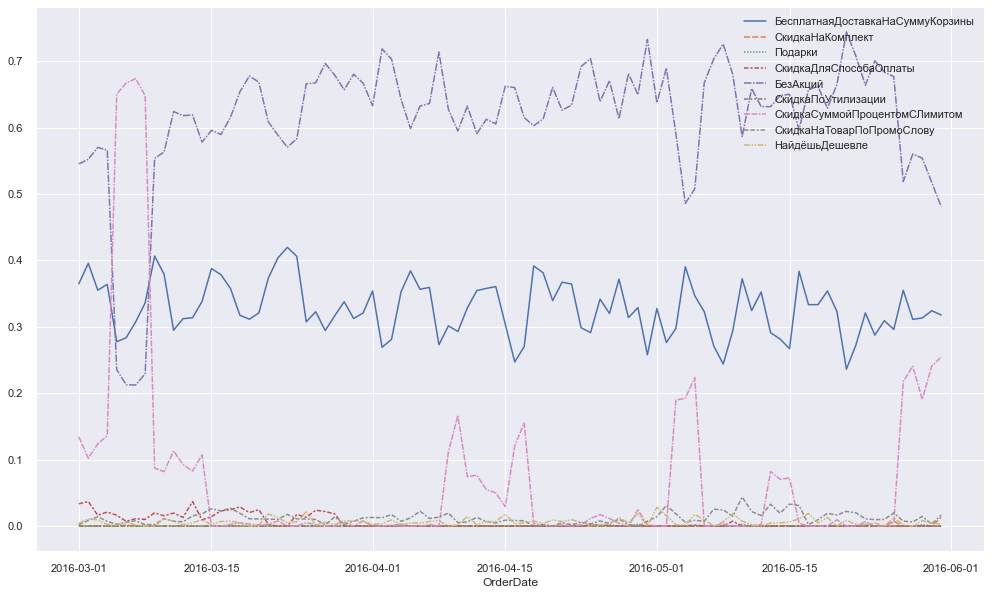

Мелкая бытовая техника


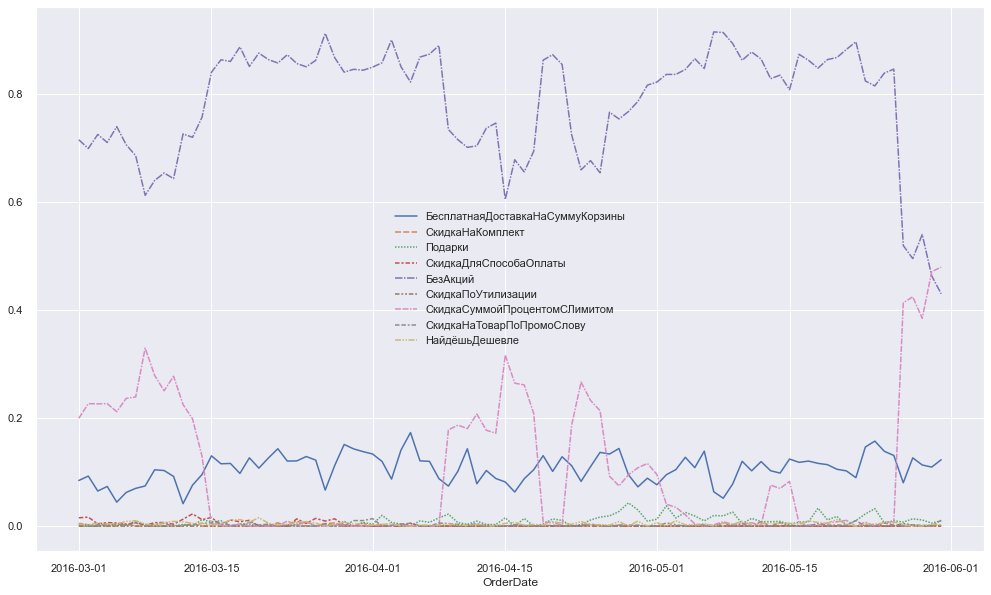

Сделай сам


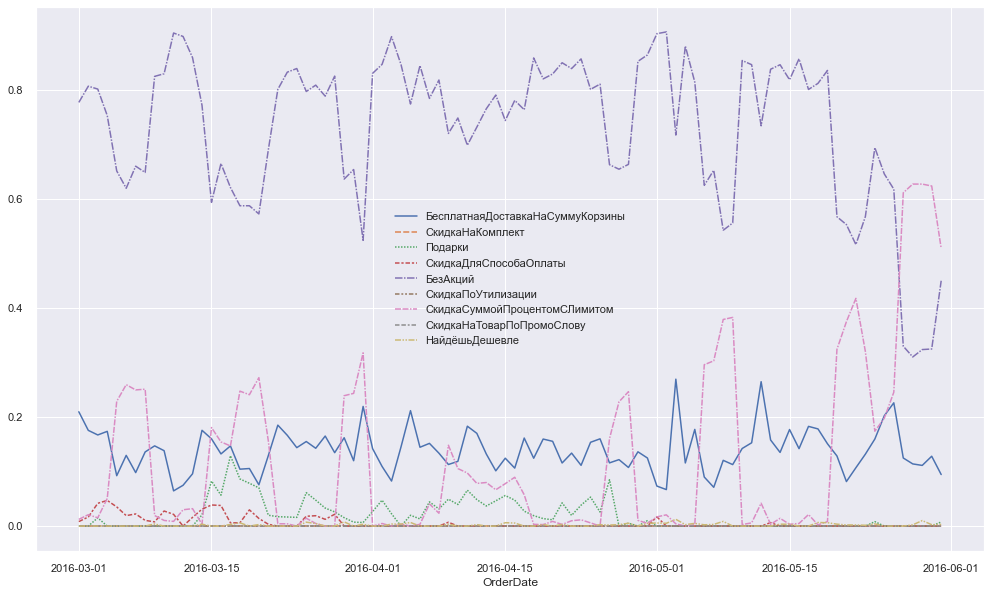

Спорт и активный отдых


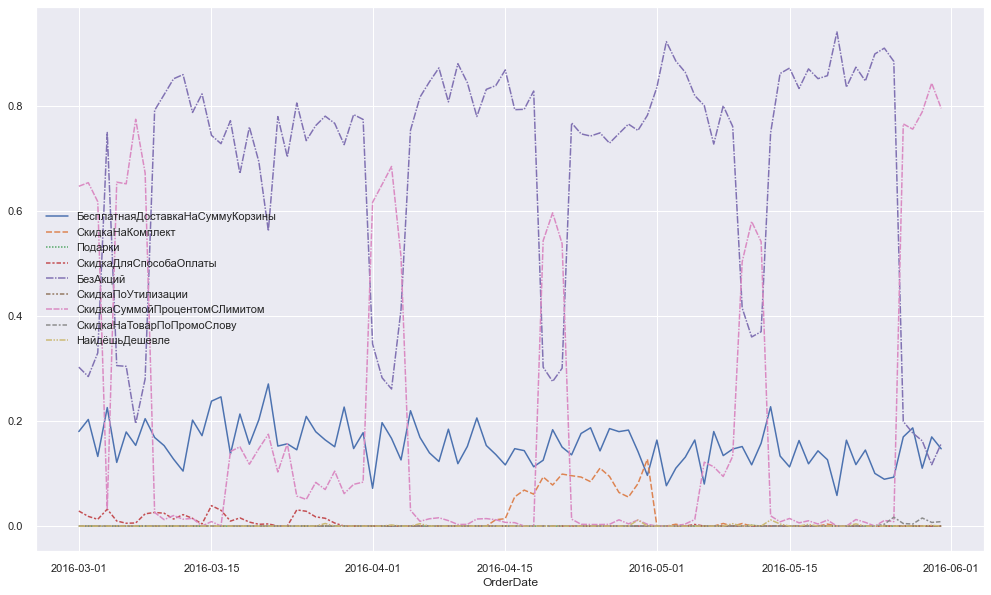

In [20]:
actions = ['БезАкций', 'БесплатнаяДоставкаНаСуммуКорзины', 'СкидкаСуммойПроцентомСЛимитом', 'СкидкаДляСпособаОплаты']
categories = ['Детские товары', 'Крупная бытовая техника', "Мелкая бытовая техника", "Сделай сам", "Спорт и активный отдых"]

for category in categories:
  all = full_ds[full_ds['TN'].str.contains(category, na = False)].sort_values("OrderDate").groupby("OrderDate").size()
  cats_df = all.to_frame(name="all")

  for action in all_actions:
    curr_cat = full_ds[full_ds['Actions'].str.contains(action, na = False) & full_ds['TN'].str.contains(category)].sort_values("OrderDate").groupby("OrderDate").size().divide(all, fill_value=0).to_frame(name=action)
    cats_df = cats_df.merge(curr_cat, on='OrderDate', how='left')

  # actions_df = actions_df.rename(index=lambda s: datetime.strptime(str(int(s))+"_2022", "%W_%Y"))
  print(category.strip().capitalize())

  sns.set(rc={'figure.figsize':(17,10)})
  sns.lineplot(data=cats_df.drop(columns='all'))
  plt.show()

БесплатнаяДоставкаНаСуммуКорзины


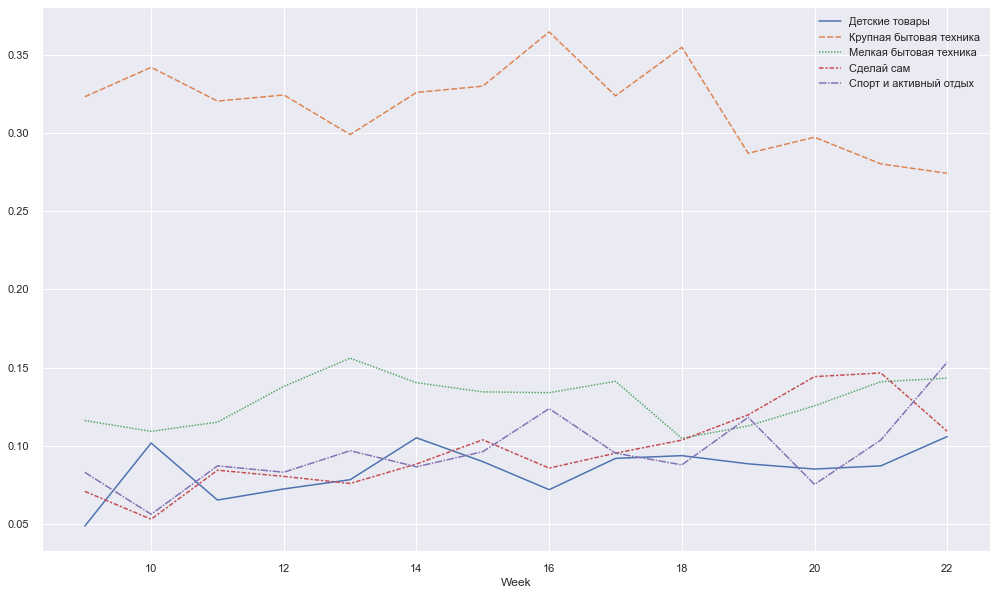

СкидкаНаКомплект


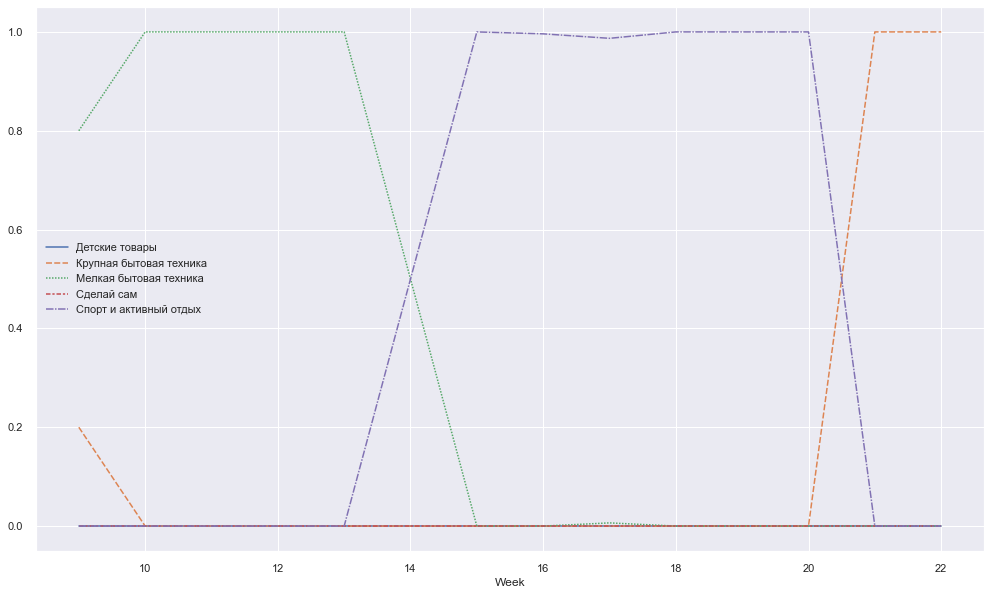

Подарки


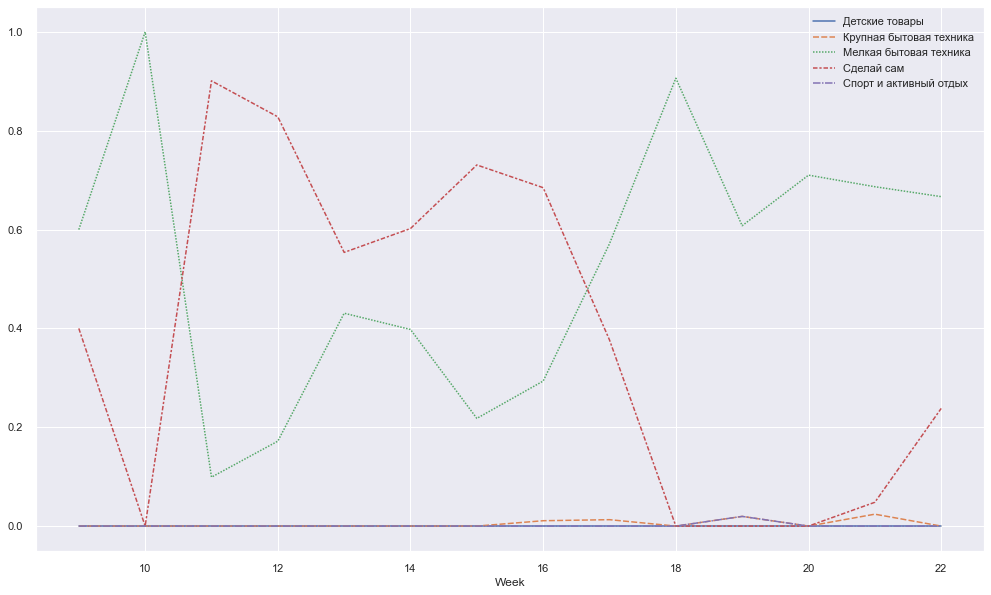

СкидкаДляСпособаОплаты


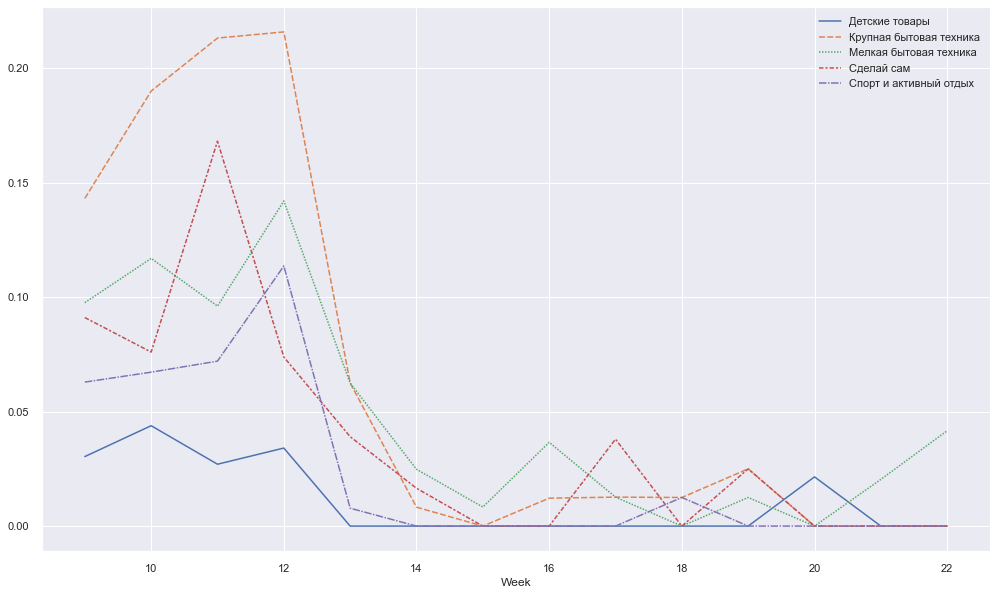

БезАкций


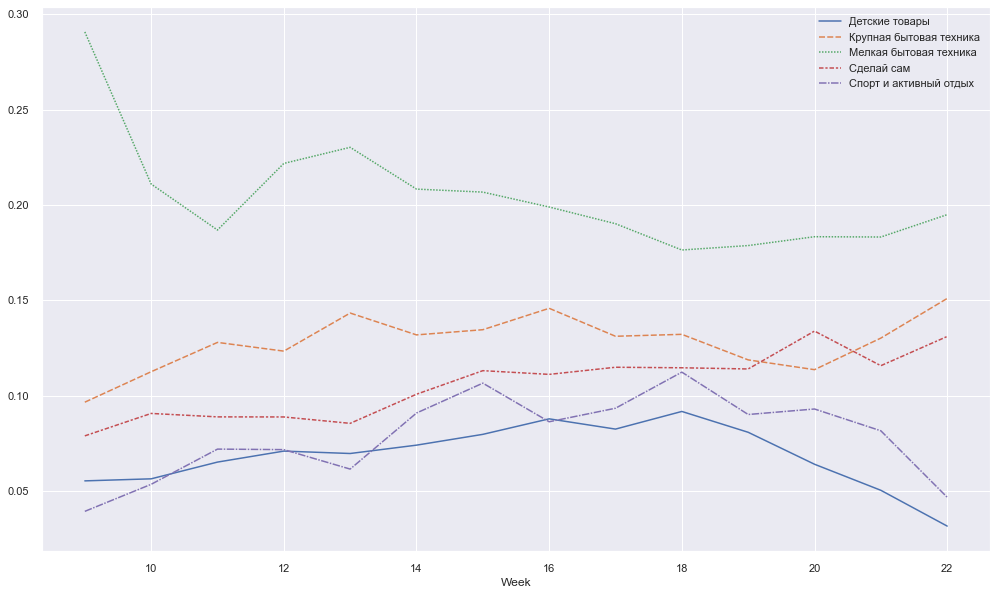

СкидкаПоУтилизации


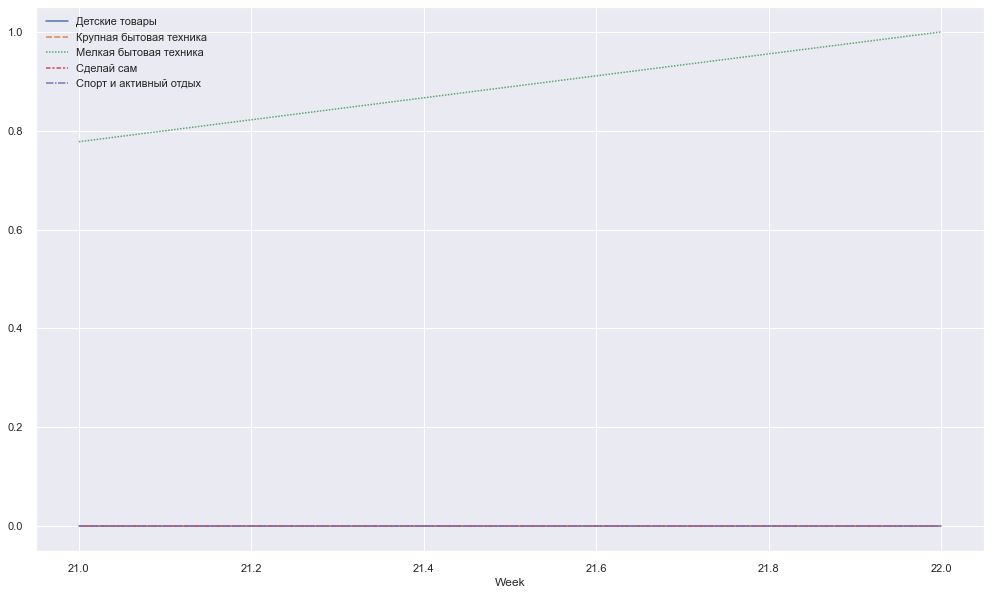

СкидкаСуммойПроцентомСЛимитом


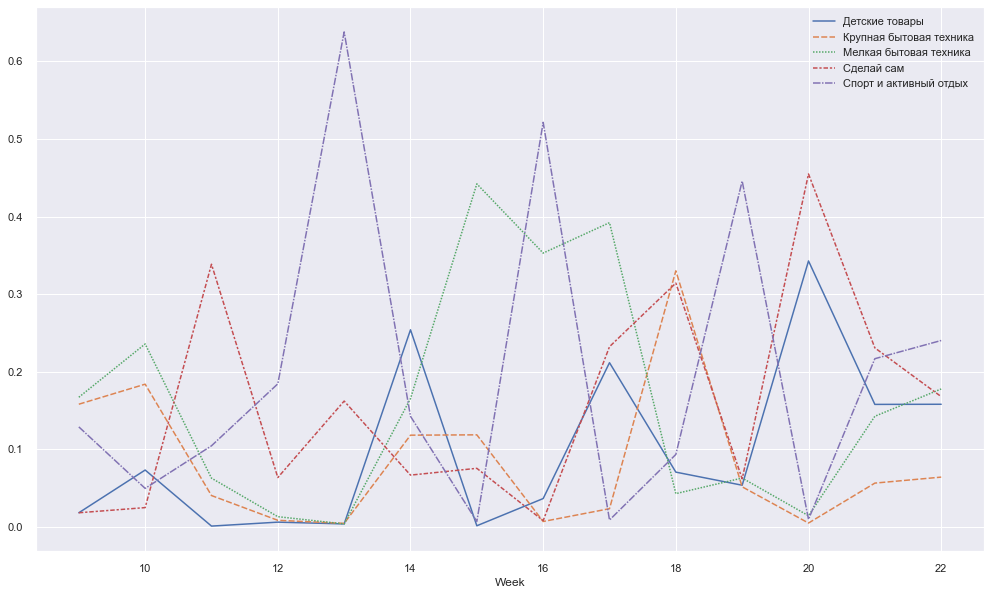

СкидкаНаТоварПоПромоСлову


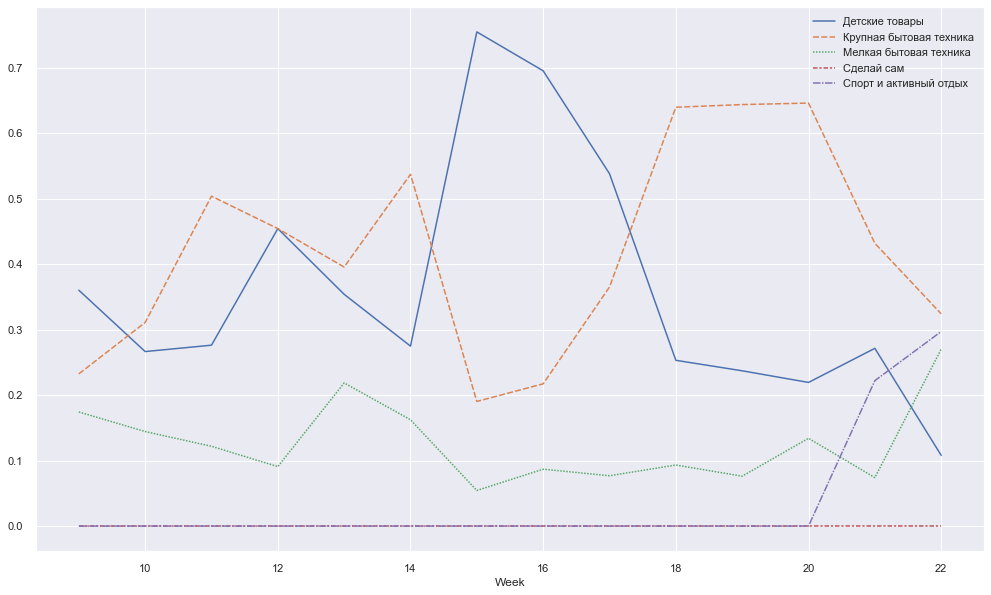

НайдёшьДешевле


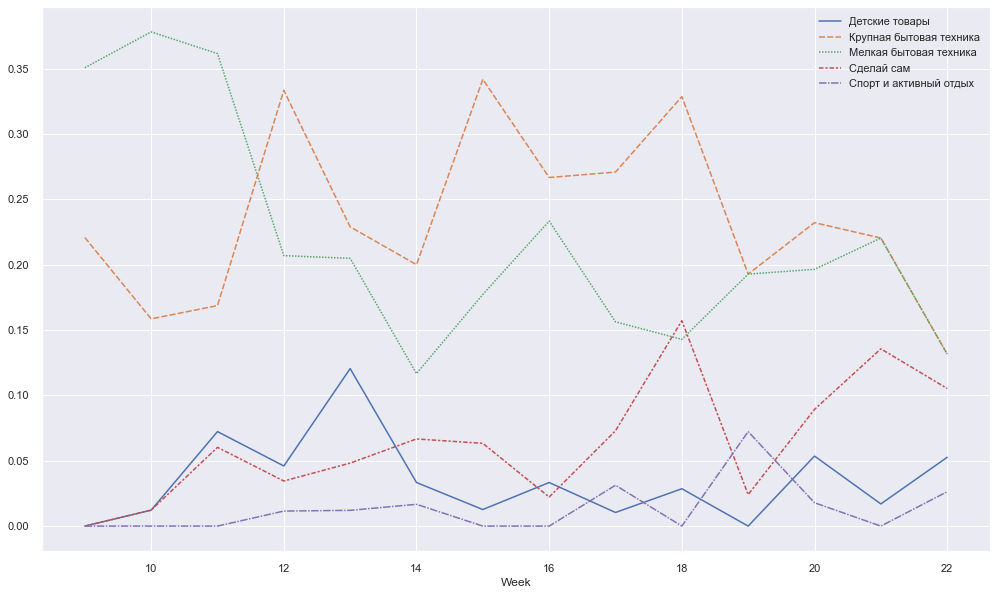

In [21]:
for action in all_actions:
  all = full_ds[full_ds['Actions'].str.contains(action, na = False)].sort_values("Week").groupby("Week").size()
  actions_df = all.to_frame(name="all")

  for category in categories:
    curr_action = full_ds[full_ds['Actions'].str.contains(action, na = False) & full_ds['TN'].str.contains(category)].sort_values("Week").groupby("Week").size().divide(all, fill_value=0).to_frame(name=category)
    actions_df = actions_df.merge(curr_action, on='Week', how='left')

  # actions_df = actions_df.rename(index=lambda s: datetime.strptime(str(int(s))+"_2022", "%W_%Y"))
  print(action)

  sns.set(rc={'figure.figsize':(17,10)})
  sns.lineplot(data=actions_df.drop(columns='all'))
  plt.show()

In [ ]:
# sns.set(rc={'figure.figsize':(10,6)})
# full_ds.loc[full_ds['TN'] == "Мебель"].sort_values("Week").groupby("Week").size().plot()

In [ ]:
# all_cats = full_ds.loc[full_ds['TN'] == "Мебель"].sort_values("Week").groupby("Week").size().to_frame(name='Мебель')
# for cat in full_ds['TN'].unique():
#   if cat == "Мебель":
#     continue
#   curr_cat = full_ds.loc[full_ds['TN'] == cat].sort_values("Week").groupby("Week").size().to_frame(name=cat)
#   all_cats = all_cats.merge(curr_cat, on='Week', how='left')
# all_cats

# sns.set(rc={'figure.figsize':(21,15)})
# sns.lineplot(data=all_cats)
# plt.show()

**Дисперсионный анализ**

In [19]:
def ssw(main_data, group_col, value_col):
    group_names = main_data[group_col].unique()
    return np.sum([
        (
            main_data.loc[main_data[group_col] == group, value_col] -
            main_data.loc[main_data[group_col] == group, value_col].mean()
        ) ** 2
        for group in group_names
    ])


def ssb(main_data, group_col, value_col):
    group_names = main_data[group_col].unique()
    overall_mean = main_data[value_col].mean()
    return np.sum([
        len(main_data.loc[main_data[group_col] == group, value_col]) * (
            main_data.loc[main_data[group_col] == group, value_col].mean() -
            overall_mean
        ) ** 2
        for group in group_names
    ])


def get_anova_results(df):
    groups = df['action'].unique()
    subsets = [df.query('action == @group')['value'] for group in groups]

    ssb_df = len(groups) - 1
    ssw_df = df.shape[0] - len(groups)

    SSW = ssw(df, 'action', 'value')
    SSB = ssb(df, 'action', 'value')

    f_val, p_val = stats.f_oneway(*subsets)

    anova_results = pd.DataFrame([
    {
            'ssb_df': ssb_df,
            'ssw_df': ssw_df,
            'SSB': '{0:.2f}'.format(SSB),
            'SSB / ssb_df': '{0:.2f}'.format(SSB / ssb_df),
            'SSW': '{0:.2f}'.format(SSW),
            'SSW / ssw_df': '{0:.2f}'.format(SSW / ssw_df),
            'F-value': '{0:.2f}'.format(f_val),
            'p-value': '{0:.4f}'.format(p_val),
        }
    ], index=['Result'])

    return anova_results

In [65]:
def get_tukey_results(groups, vals):
    df = pd.DataFrame({'score': vals,
                   'group': np.repeat(groups, repeats=30)}) 

    tukey = pairwise_tukeyhsd(endog=df['score'],
                              groups=df['group'],
                              alpha=0.05)

    print(tukey)

In [18]:
all_actions = set()
for i in full_ds['Actions'].unique():
    all_actions = all_actions.union(set(i.split(',')))
    
all_actions

{'БезАкций',
 'БесплатнаяДоставкаНаСуммуКорзины',
 'НайдёшьДешевле',
 'Подарки',
 'СкидкаДляСпособаОплаты',
 'СкидкаНаКомплект',
 'СкидкаНаТоварПоПромоСлову',
 'СкидкаПоУтилизации',
 'СкидкаСуммойПроцентомСЛимитом'}

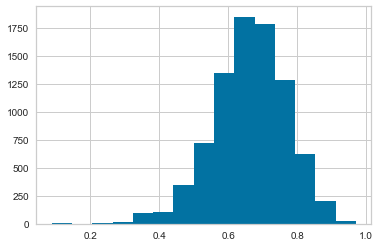

In [7]:
# проверка на нормальность ген совокупности 
N = 30
h = pd.DataFrame()

curr_ds = full_ds.loc[].iloc[:42000]

samples = np.array_split(curr_ds, 840)
for sample in samples:
    M = len(sample.loc[sample['Status']=='Выдан клиенту']) / len(sample)
    h = h.append(pd.Series({
        'value': M, 
    }), ignore_index=True)

h = h['value'].hist(bins=15)
fig = h.get_figure()

**Дисперсионный анализ выкупаемости (полная выборка)** 

In [14]:
actions = ['БезАкций']
actions.append('СкидкаНаТоварПоПромоСлову')
# actions.append('СкидкаНаКомплект')
# actions.append('НайдёшьДешевле')
# actions.append('СкидкаДляСпособаОплаты')
# actions.append('СкидкаПоУтилизации')
# actions.append('Подарки')
actions.append('СкидкаСуммойПроцентомСЛимитом')
actions.append('БесплатнаяДоставкаНаСуммуКорзины')
categories = ['Детские товары', 'Крупная бытовая техника', "Мелкая бытовая техника", "Сделай сам", "Спорт и активный отдых"]

In [60]:
N = 30
bo_df = pd.DataFrame()

tukey_groups = []
tukey_vals = []

for a in actions:
    tukey_groups.append(a)
#     curr_ds = full_ds.loc[full_ds['TN']=='Крупная бытовая техника'].loc[full_ds['Actions']==a].iloc[:300]
    curr_ds = full_ds.loc[full_ds['Actions']==a].iloc[:300]
    print(a+": "+str(len(curr_ds)))

#     for i in range(N):
#         sample = curr_ds.iloc[np.random.randint(0, len(curr_ds), size=50)]
#         M = len(sample.loc[full_ds['Status']=='Выдан клиенту']) / len(sample)

#         bo_df = bo_df.append(pd.Series({
#             'value': M, 
#             'action': a
#         }), ignore_index=True)
        
    samples = np.array_split(curr_ds, N)
    for sample in samples:
        M = len(sample.loc[sample['Status']=='Выдан клиенту']) / len(sample)
        bo_df = bo_df.append(pd.Series({
            'value': M, 
            'action': a
        }), ignore_index=True)
        
        tukey_vals.append(M)

# bo_df


БезАкций: 300
СкидкаНаТоварПоПромоСлову: 300
СкидкаСуммойПроцентомСЛимитом: 300
БесплатнаяДоставкаНаСуммуКорзины: 300


In [66]:
get_tukey_results(actions, tukey_vals)

                          Multiple Comparison of Means - Tukey HSD, FWER=0.05                          
             group1                           group2              meandiff p-adj   lower  upper  reject
-------------------------------------------------------------------------------------------------------
                        БезАкций БесплатнаяДоставкаНаСуммуКорзины     0.19 0.0001  0.0794 0.3006   True
                        БезАкций        СкидкаНаТоварПоПромоСлову   0.1767 0.0004   0.066 0.2873   True
                        БезАкций    СкидкаСуммойПроцентомСЛимитом   0.1233 0.0225  0.0127  0.234   True
БесплатнаяДоставкаНаСуммуКорзины        СкидкаНаТоварПоПромоСлову  -0.0133 0.9892  -0.124 0.0973  False
БесплатнаяДоставкаНаСуммуКорзины    СкидкаСуммойПроцентомСЛимитом  -0.0667 0.3994 -0.1773  0.044  False
       СкидкаНаТоварПоПромоСлову    СкидкаСуммойПроцентомСЛимитом  -0.0533 0.5924  -0.164 0.0573  False
----------------------------------------------------------------

In [70]:
bo_df.groupby('action').mean()

,value
action,
БезАкций,0.536667
БесплатнаяДоставкаНаСуммуКорзины,0.726667
СкидкаНаТоварПоПромоСлову,0.713333
СкидкаСуммойПроцентомСЛимитом,0.660000


In [71]:
bo_df.groupby('action').std()

,value
action,
БезАкций,0.180962
БесплатнаяДоставкаНаСуммуКорзины,0.141259
СкидкаНаТоварПоПромоСлову,0.143198
СкидкаСуммойПроцентомСЛимитом,0.186806


In [72]:
get_anova_results(bo_df)

,ssb_df,ssw_df,SSB,SSB / ssb_df,SSW,SSW / ssw_df,F-value,p-value
Result,3,116,0.67,0.22,3.14,0.03,8.32,0.0000


<ErrorbarContainer object of 3 artists>

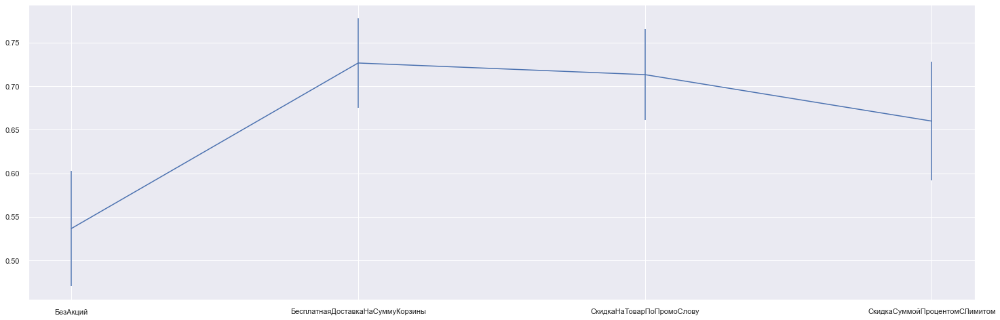

In [73]:
groups = bo_df.groupby('action')['value']
n = groups.apply(len)
mean = groups.mean()
std = groups.std() / np.sqrt(n)

sns.set(rc={'figure.figsize':(25,8)})
plt.errorbar(x = mean.index, y = mean, yerr = 2*std)

In [77]:
x1=0.660000
x2=0.726667
sd1=0.186806
sd2=0.141259
n=30

(x2-x1) / ((sd1**2)/n+(sd2**2)/n)**(1/2)

1.5591248768825943

**Дисперсионный анализ выкупаемости (КБТ)** 

In [186]:
N = 30
bo_df = pd.DataFrame()

for a in actions:
    curr_ds = full_ds.loc[full_ds['TN']=='Крупная бытовая техника'].loc[full_ds['Actions']==a].iloc[:300]
#     curr_ds = full_ds.loc[full_ds['Actions']==a].iloc[:300]
    print(a+": "+str(len(curr_ds)))
        
    samples = np.array_split(curr_ds, N)
    for sample in samples:
        M = len(sample.loc[sample['Status']=='Выдан клиенту']) / len(sample)
        bo_df = bo_df.append(pd.Series({
            'value': M, 
            'action': a
        }), ignore_index=True)

# bo_df


БезАкций: 300
СкидкаНаТоварПоПромоСлову: 300
СкидкаСуммойПроцентомСЛимитом: 300
БесплатнаяДоставкаНаСуммуКорзины: 300


In [187]:
bo_df.groupby('action').mean()

,value
action,
БезАкций,0.576667
БесплатнаяДоставкаНаСуммуКорзины,0.710000
СкидкаНаТоварПоПромоСлову,0.586667
СкидкаСуммойПроцентомСЛимитом,0.660000


In [188]:
bo_df.groupby('action').std()

,value
action,
БезАкций,0.179431
БесплатнаяДоставкаНаСуммуКорзины,0.156139
СкидкаНаТоварПоПромоСлову,0.208001
СкидкаСуммойПроцентомСЛимитом,0.192264


In [189]:
get_anova_results(bo_df)

,ssb_df,ssw_df,SSB,SSB / ssb_df,SSW,SSW / ssw_df,F-value,p-value
Result,3,116,0.36,0.12,3.97,0.03,3.50,0.0177


<ErrorbarContainer object of 3 artists>

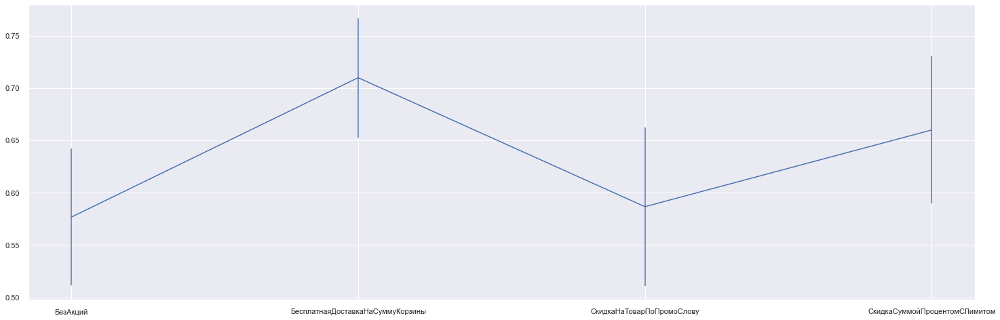

In [190]:
groups = bo_df.groupby('action')['value']
n = groups.apply(len)
mean = groups.mean()
std = groups.std() / np.sqrt(n)

sns.set(rc={'figure.figsize':(25,8)})
plt.errorbar(x = mean.index, y = mean, yerr = 2*std)

**Дисперсионный анализ выкупаемости (по кластерам)** 

In [83]:
cluster_df = ds[["k-cluster"]]
full_ds = full_ds.merge(cluster_df, left_on='Phone_new', right_on='Клиент', how='left')

In [84]:
full_ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 286554 entries, 0 to 286553
Data columns (total 39 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Order_ID      286554 non-null  object        
 1   Email_new     286554 non-null  object        
 2   Phone_new     286554 non-null  object        
 3   Area2         286552 non-null  object        
 4   Source        286554 non-null  object        
 5   OrderDate     286554 non-null  datetime64[ns]
 6   время         286554 non-null  object        
 7   месяц         286554 non-null  int64         
 8   ChangeDate    286554 non-null  object        
 9   DeliveryDate  286554 non-null  object        
 10  PaymentDate   286554 non-null  object        
 11  Status        286554 non-null  object        
 12  Status_ID     286554 non-null  int64         
 13  OneClick      286554 non-null  int64         
 14  CancelReason  99241 non-null   object        
 15  Actions       286

In [150]:
N = 30
bo_df = pd.DataFrame()
tukey_vals = []

for a in actions:
#     curr_ds = full_ds.loc[full_ds['TN']=='Крупная бытовая техника'].loc[full_ds['Actions']==a].loc[full_ds['k-cluster']==1.0].iloc[:150]
    curr_ds = full_ds.loc[full_ds['Actions']==a].loc[full_ds['k-cluster']==2.0].iloc[:200]
    print(a+": "+str(len(curr_ds)))
        
    samples = np.array_split(curr_ds, N)
    for sample in samples:
        
        M = len(sample.loc[sample['Status']=='Выдан клиенту']) / len(sample)
        bo_df = bo_df.append(pd.Series({
            'value': M, 
            'action': a
        }), ignore_index=True)
        tukey_vals.append(M)
        
# bo_df

БезАкций: 200
СкидкаНаТоварПоПромоСлову: 130
СкидкаСуммойПроцентомСЛимитом: 200
БесплатнаяДоставкаНаСуммуКорзины: 200


In [151]:
get_tukey_results(actions, tukey_vals)

                          Multiple Comparison of Means - Tukey HSD, FWER=0.05                          
             group1                           group2              meandiff p-adj   lower  upper  reject
-------------------------------------------------------------------------------------------------------
                        БезАкций БесплатнаяДоставкаНаСуммуКорзины   0.0952 0.4389 -0.0699 0.2604  False
                        БезАкций        СкидкаНаТоварПоПромоСлову   0.1747 0.0338  0.0095 0.3398   True
                        БезАкций    СкидкаСуммойПроцентомСЛимитом   0.1214 0.2268 -0.0437 0.2866  False
БесплатнаяДоставкаНаСуммуКорзины        СкидкаНаТоварПоПромоСлову   0.0794  0.594 -0.0857 0.2446  False
БесплатнаяДоставкаНаСуммуКорзины    СкидкаСуммойПроцентомСЛимитом   0.0262 0.9761  -0.139 0.1913  False
       СкидкаНаТоварПоПромоСлову    СкидкаСуммойПроцентомСЛимитом  -0.0533  0.835 -0.2184 0.1119  False
----------------------------------------------------------------

In [152]:
bo_df.groupby('action').mean()

,value
action,
БезАкций,0.360317
БесплатнаяДоставкаНаСуммуКорзины,0.455556
СкидкаНаТоварПоПромоСлову,0.535000
СкидкаСуммойПроцентомСЛимитом,0.481746


In [153]:
bo_df.groupby('action').std()

,value
action,
БезАкций,0.228007
БесплатнаяДоставкаНаСуммуКорзины,0.295385
СкидкаНаТоварПоПромоСлову,0.264298
СкидкаСуммойПроцентомСЛимитом,0.178139


In [154]:
get_anova_results(bo_df)

,ssb_df,ssw_df,SSB,SSB / ssb_df,SSW,SSW / ssw_df,F-value,p-value
Result,3,116,0.48,0.16,6.98,0.06,2.66,0.0512


<ErrorbarContainer object of 3 artists>

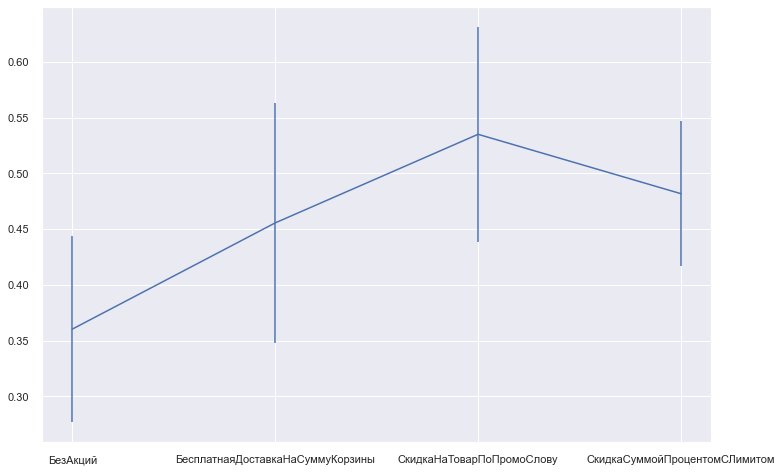

In [155]:
groups = bo_df.groupby('action')['value']
n = groups.apply(len)
mean = groups.mean()
std = groups.std() / np.sqrt(n)

sns.set(rc={'figure.figsize':(12,8)})
plt.errorbar(x = mean.index, y = mean, yerr = 2*std)

**Дисперсионный анализ доли товара в категории (полная выборка)**

In [201]:
N = 30
np_df = pd.DataFrame()
tukey_vals = []

for a in actions:
    curr_ds = full_ds.loc[full_ds['TN']=='Крупная бытовая техника'].loc[full_ds['Actions']==a]

    for i in range(N):
        sample = curr_ds.iloc[np.random.randint(0, len(curr_ds), size=50)]
        M = len(sample.loc[full_ds['NomGroup']=='Стиральные машины']) / len(sample)

        np_df = np_df.append(pd.Series({
            'value': M, 
            'action': a
        }), ignore_index=True)
        tukey_vals.append(M)

np_df

,action,value
0,БезАкций,0.28
1,БезАкций,0.18
2,БезАкций,0.16
3,БезАкций,0.18
4,БезАкций,0.24
...,...,...
115,БесплатнаяДоставкаНаСуммуКорзины,0.14
116,БесплатнаяДоставкаНаСуммуКорзины,0.22
117,БесплатнаяДоставкаНаСуммуКорзины,0.16
118,БесплатнаяДоставкаНаСуммуКорзины,0.26


In [202]:
np_df.groupby('action').mean()

,value
action,
БезАкций,0.202000
БесплатнаяДоставкаНаСуммуКорзины,0.227333
СкидкаНаТоварПоПромоСлову,0.096000
СкидкаСуммойПроцентомСЛимитом,0.244667


In [203]:
np_df.groupby('action').std()

,value
action,
БезАкций,0.052614
БесплатнаяДоставкаНаСуммуКорзины,0.048844
СкидкаНаТоварПоПромоСлову,0.043755
СкидкаСуммойПроцентомСЛимитом,0.070011


In [204]:
get_anova_results(np_df)

,ssb_df,ssw_df,SSB,SSB / ssb_df,SSW,SSW / ssw_df,F-value,p-value
Result,3,116,0.40,0.13,0.35,0.00,44.57,0.0000


In [205]:
get_tukey_results(actions, tukey_vals)

                          Multiple Comparison of Means - Tukey HSD, FWER=0.05                           
             group1                           group2              meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------------------------------
                        БезАкций БесплатнаяДоставкаНаСуммуКорзины   0.0253 0.2817 -0.0115  0.0622  False
                        БезАкций        СкидкаНаТоварПоПромоСлову   -0.106    0.0 -0.1428 -0.0692   True
                        БезАкций    СкидкаСуммойПроцентомСЛимитом   0.0427 0.0162  0.0058  0.0795   True
БесплатнаяДоставкаНаСуммуКорзины        СкидкаНаТоварПоПромоСлову  -0.1313   -0.0 -0.1682 -0.0945   True
БесплатнаяДоставкаНаСуммуКорзины    СкидкаСуммойПроцентомСЛимитом   0.0173 0.6109 -0.0195  0.0542  False
       СкидкаНаТоварПоПромоСлову    СкидкаСуммойПроцентомСЛимитом   0.1487   -0.0  0.1118  0.1855   True
-------------------------------------------------------

<ErrorbarContainer object of 3 artists>

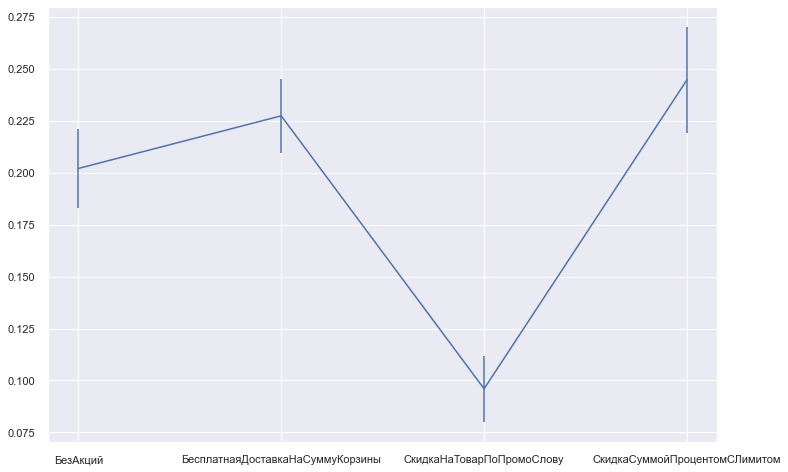

In [206]:
groups = np_df.groupby('action')['value']
n = groups.apply(len)
mean = groups.mean()
std = groups.std() / np.sqrt(n)

sns.set(rc={'figure.figsize':(12,8)})
plt.errorbar(x = mean.index, y = mean, yerr = 2*std)

Детские товары


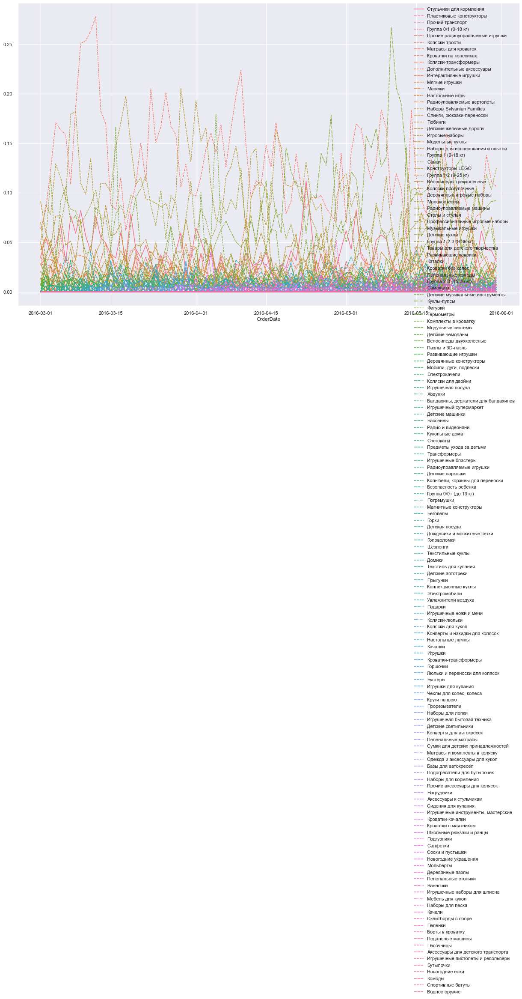

Крупная бытовая техника


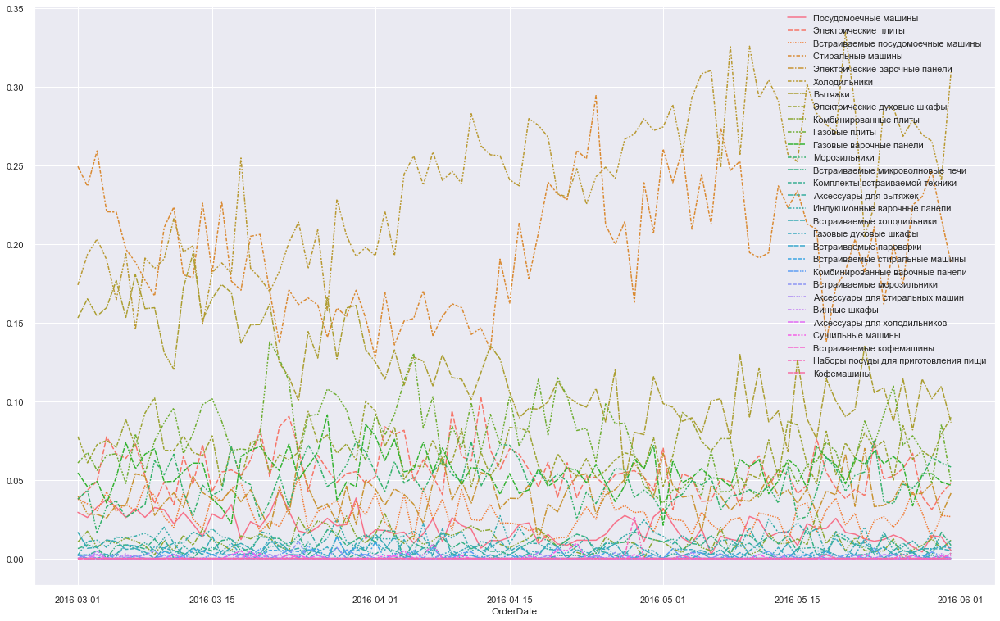

Мелкая бытовая техника


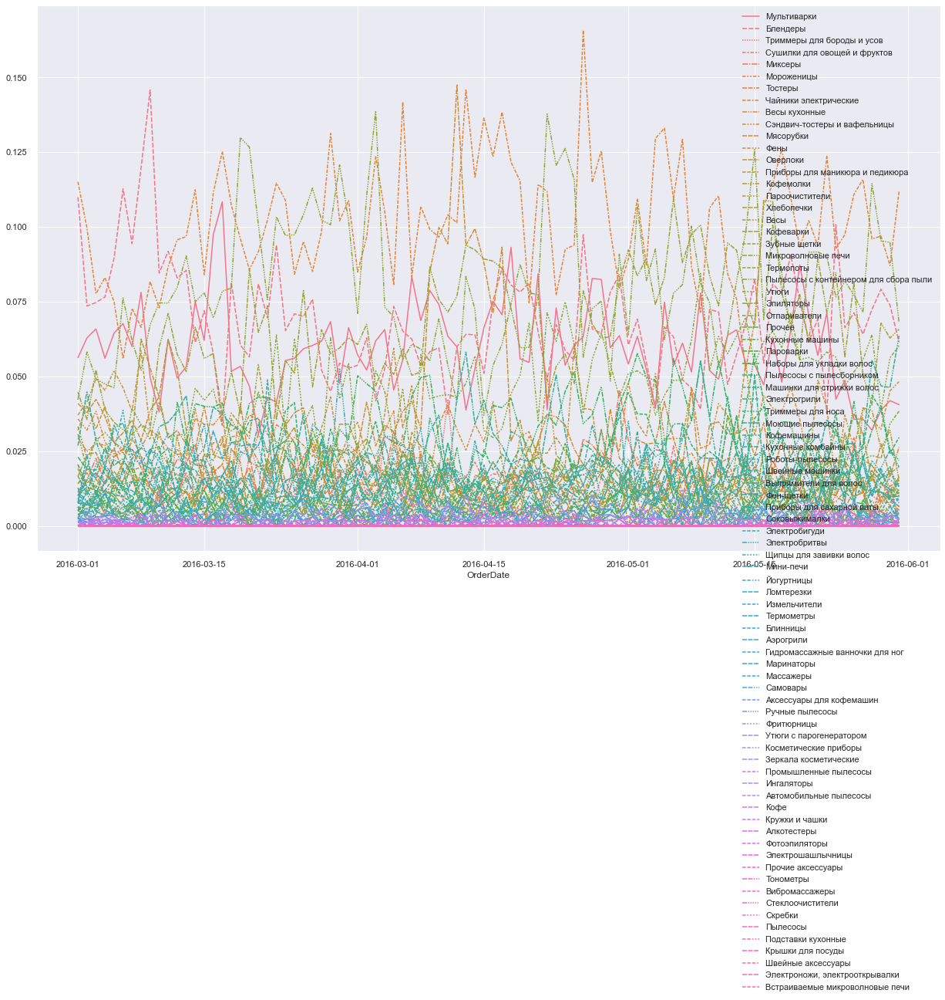

Сделай сам


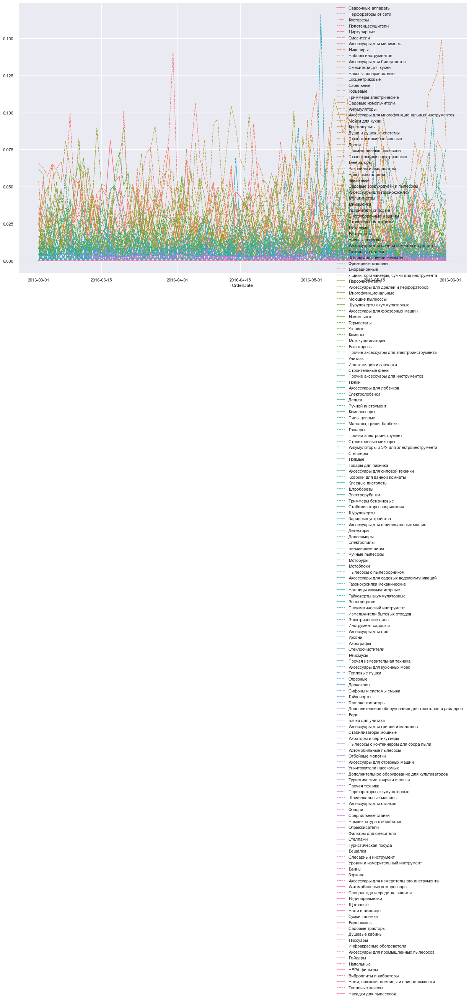

Спорт и активный отдых


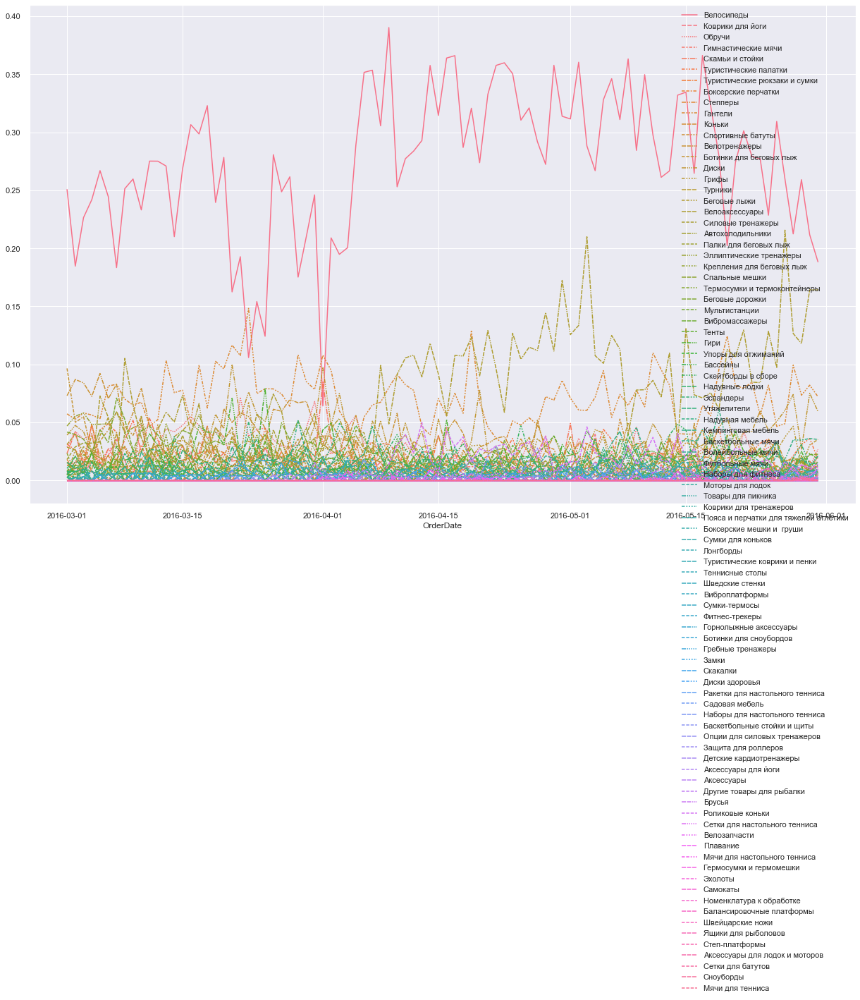

In [242]:
for tn in categories:
    units = full_ds.loc[full_ds['TN']==tn]['NomGroup'].unique()
    
    all_units = full_ds.loc[full_ds['TN']==tn].sort_values("OrderDate").groupby("OrderDate").size()
    tn_df = all_units.to_frame(name="all_units")

    for unit in units:
        curr_unit = full_ds.loc[full_ds['TN']==tn].loc[full_ds['NomGroup']==unit].sort_values("OrderDate").groupby("OrderDate").size().divide(all_units, fill_value=0).to_frame(name=unit)
        tn_df = tn_df.merge(curr_unit, on='OrderDate', how='left')

    print(tn)
    sns.set(rc={'figure.figsize':(21,13)})
    sns.lineplot(data=tn_df.drop(columns='all'))
    plt.show()

**Дисперсионный анализ доли товара в категории (по кластерам)**

In [194]:
N = 30
np_df = pd.DataFrame()
tukey_vals = []

for a in actions:
    curr_ds = full_ds.loc[full_ds['TN']=='Крупная бытовая техника'].loc[full_ds['k-cluster']==1.0].loc[full_ds['Actions']==a].iloc[:150]
    print(a+": "+str(len(curr_ds)))
    
    samples = np.array_split(curr_ds, N)
    for sample in samples:
        M = len(sample.loc[sample['NomGroup']=='Стиральные машины']) / len(sample)
        np_df = np_df.append(pd.Series({
            'value': M, 
            'action': a
        }), ignore_index=True)
        
        tukey_vals.append(M)
        
np_df

БезАкций: 150
СкидкаНаТоварПоПромоСлову: 136
СкидкаСуммойПроцентомСЛимитом: 150
БесплатнаяДоставкаНаСуммуКорзины: 150


,action,value
0,БезАкций,0.2
1,БезАкций,0.4
2,БезАкций,0.0
3,БезАкций,0.4
4,БезАкций,0.2
...,...,...
115,БесплатнаяДоставкаНаСуммуКорзины,0.0
116,БесплатнаяДоставкаНаСуммуКорзины,0.0
117,БесплатнаяДоставкаНаСуммуКорзины,0.4
118,БесплатнаяДоставкаНаСуммуКорзины,0.0


In [195]:
np_df.groupby('action').mean()

,value
action,
БезАкций,0.166667
БесплатнаяДоставкаНаСуммуКорзины,0.220000
СкидкаНаТоварПоПромоСлову,0.060000
СкидкаСуммойПроцентомСЛимитом,0.200000


In [196]:
np_df.groupby('action').std()

,value
action,
БезАкций,0.158296
БесплатнаяДоставкаНаСуммуКорзины,0.168973
СкидкаНаТоварПоПромоСлову,0.102048
СкидкаСуммойПроцентомСЛимитом,0.216556


In [197]:
get_anova_results(np_df)

,ssb_df,ssw_df,SSB,SSB / ssb_df,SSW,SSW / ssw_df,F-value,p-value
Result,3,116,0.46,0.15,3.22,0.03,5.49,0.0015


In [199]:
get_tukey_results(actions, tukey_vals)

                          Multiple Comparison of Means - Tukey HSD, FWER=0.05                           
             group1                           group2              meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------------------------------
                        БезАкций БесплатнаяДоставкаНаСуммуКорзины   0.0533 0.6025 -0.0587  0.1654  False
                        БезАкций        СкидкаНаТоварПоПромоСлову  -0.1067 0.0683 -0.2187  0.0054  False
                        БезАкций    СкидкаСуммойПроцентомСЛимитом   0.0333 0.8655 -0.0787  0.1454  False
БесплатнаяДоставкаНаСуммуКорзины        СкидкаНаТоварПоПромоСлову    -0.16 0.0017 -0.2721 -0.0479   True
БесплатнаяДоставкаНаСуммуКорзины    СкидкаСуммойПроцентомСЛимитом    -0.02 0.9665 -0.1321  0.0921  False
       СкидкаНаТоварПоПромоСлову    СкидкаСуммойПроцентомСЛимитом     0.14  0.008  0.0279  0.2521   True
-------------------------------------------------------

<ErrorbarContainer object of 3 artists>

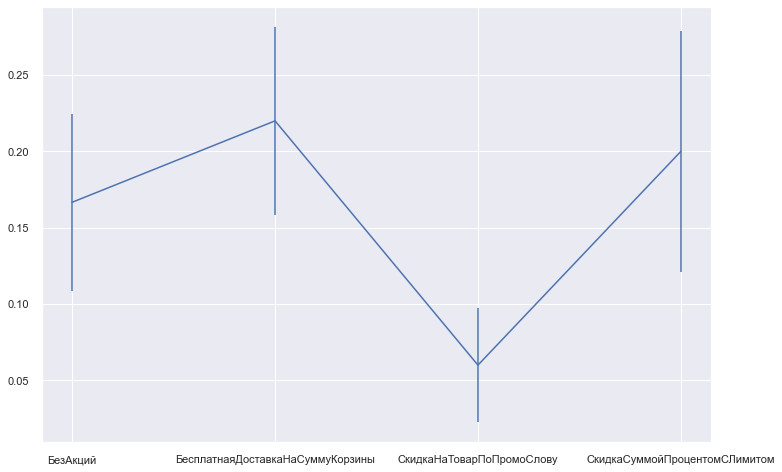

In [200]:
groups = np_df.groupby('action')['value']
n = groups.apply(len)
mean = groups.mean()
std = groups.std() / np.sqrt(n)

sns.set(rc={'figure.figsize':(12,8)})
plt.errorbar(x = mean.index, y = mean, yerr = 2*std)

Детские товары


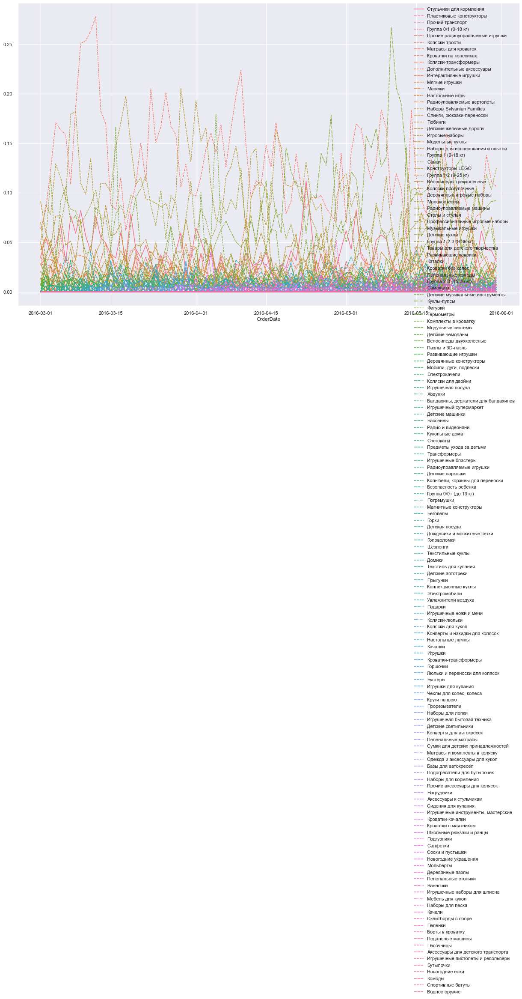

Крупная бытовая техника


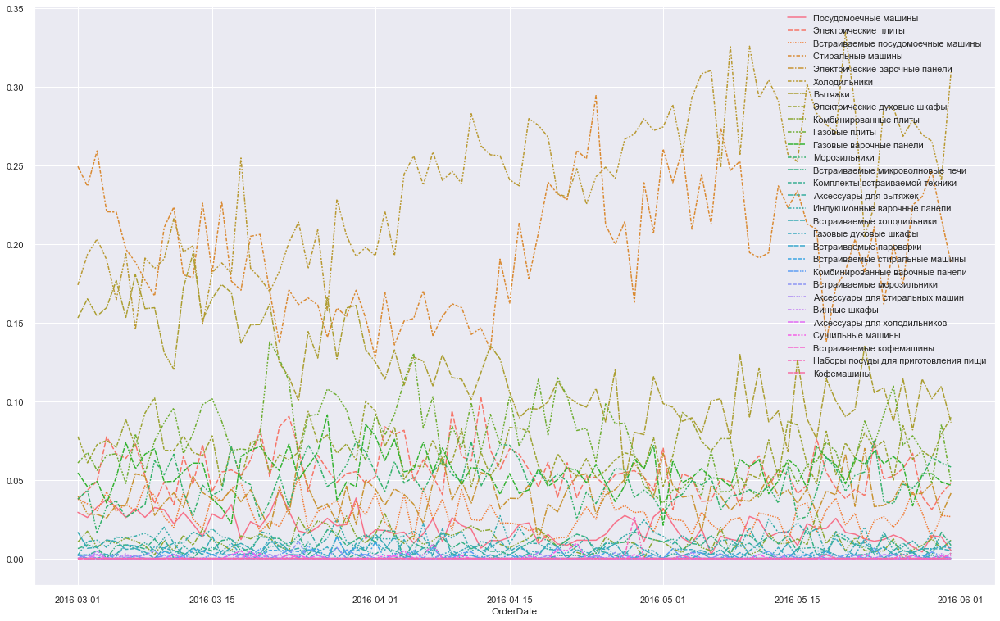

Мелкая бытовая техника


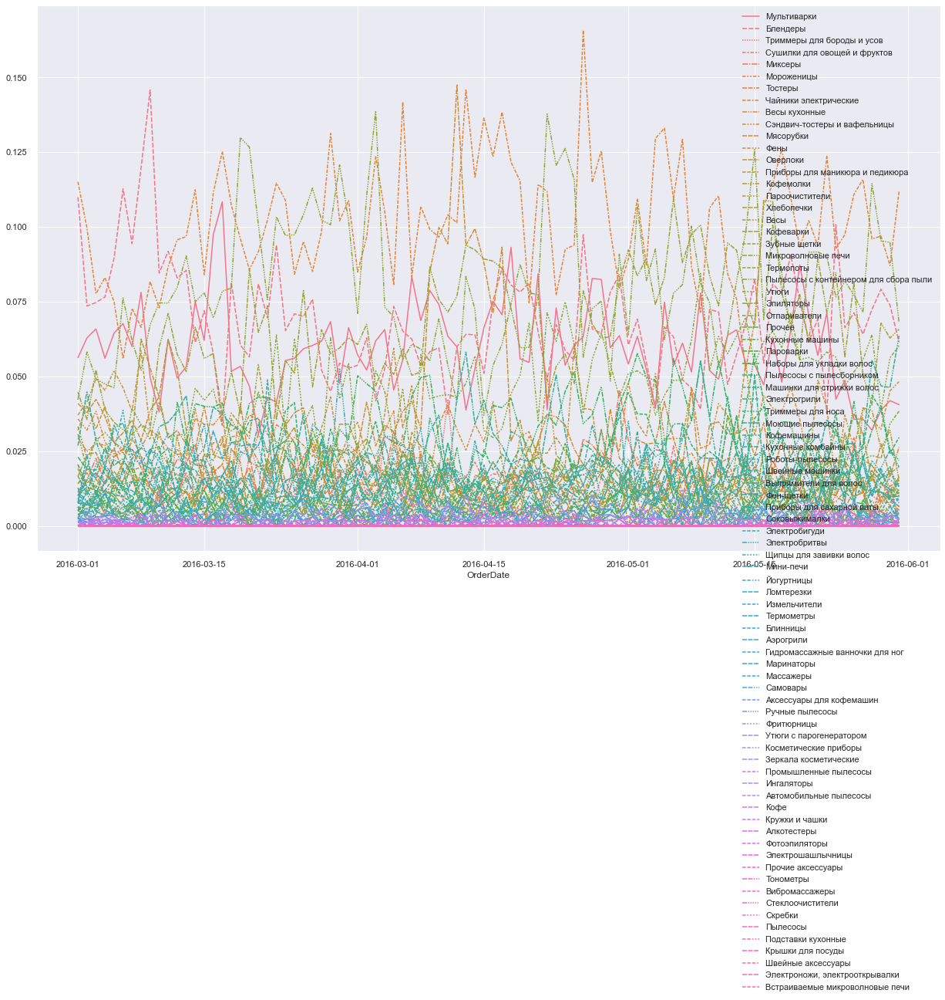

Сделай сам


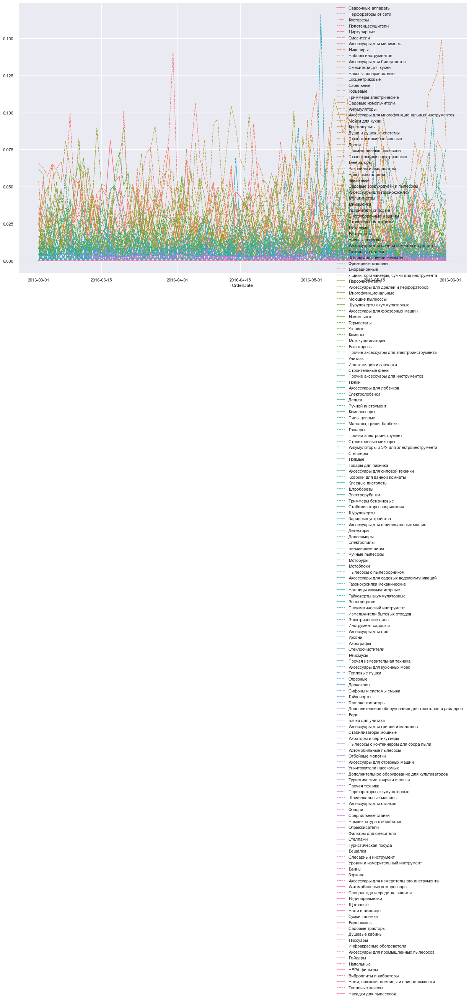

Спорт и активный отдых


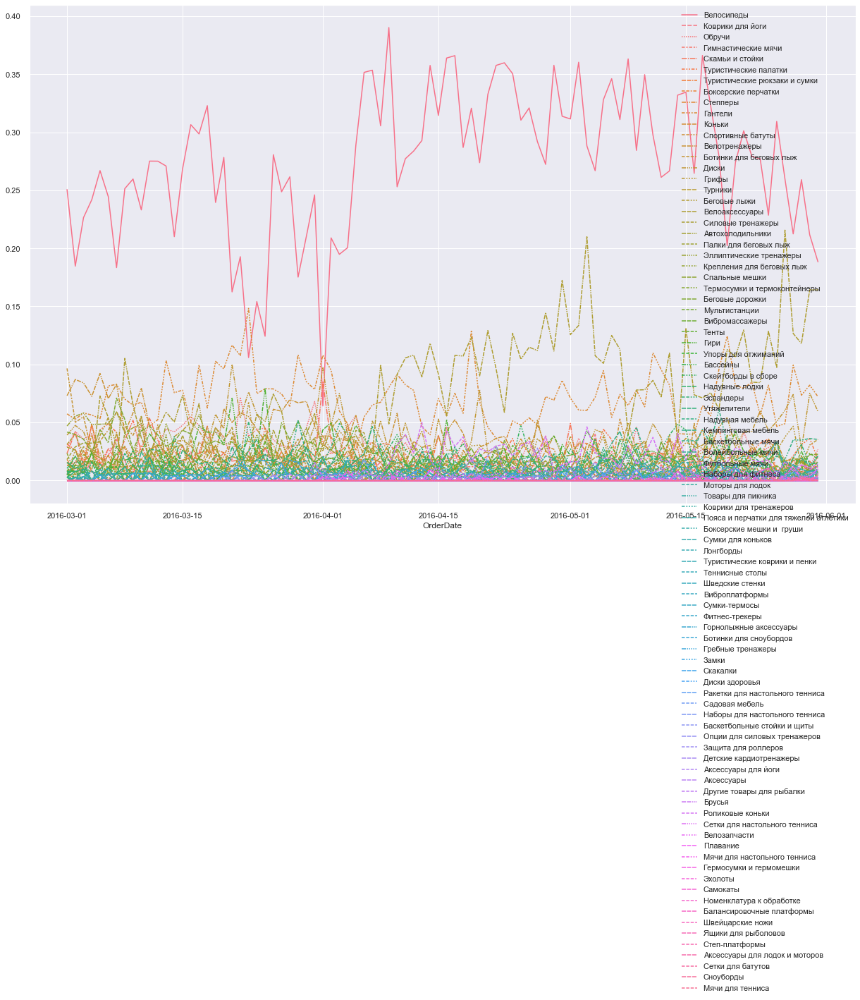

In [242]:
for tn in categories:
    units = full_ds.loc[full_ds['TN']==tn]['NomGroup'].unique()
    
    all_units = full_ds.loc[full_ds['TN']==tn].sort_values("OrderDate").groupby("OrderDate").size()
    tn_df = all_units.to_frame(name="all_units")

    for unit in units:
        curr_unit = full_ds.loc[full_ds['TN']==tn].loc[full_ds['NomGroup']==unit].sort_values("OrderDate").groupby("OrderDate").size().divide(all_units, fill_value=0).to_frame(name=unit)
        tn_df = tn_df.merge(curr_unit, on='OrderDate', how='left')

    print(tn)
    sns.set(rc={'figure.figsize':(21,13)})
    sns.lineplot(data=tn_df.drop(columns='all'))
    plt.show()